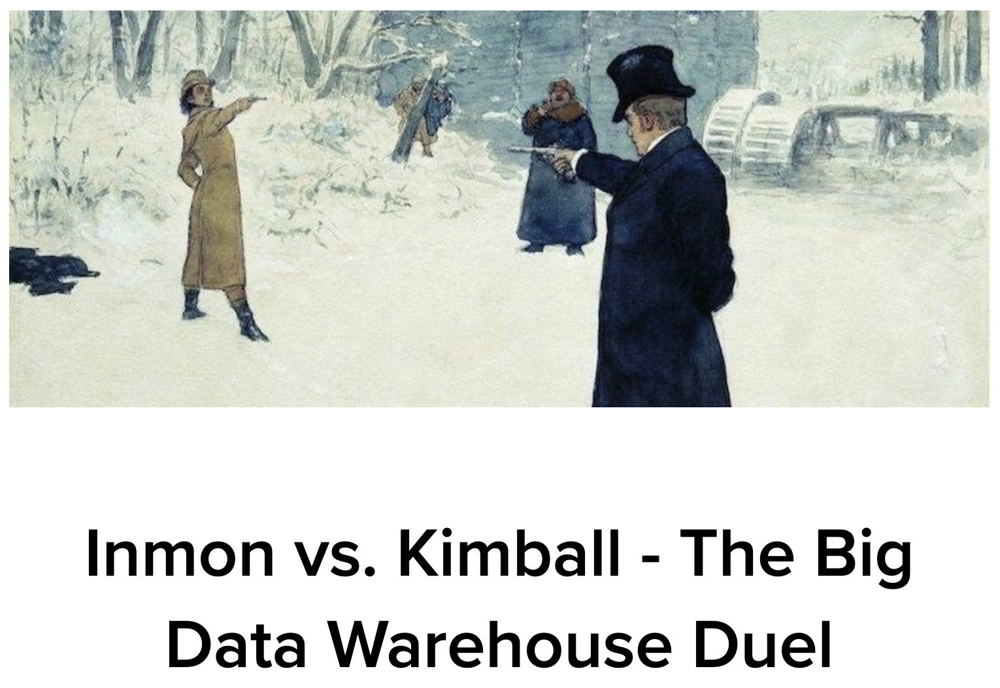

В мире хранилищ данных существует два полярных подхода к проектированию, подход Ральфа Кимбалла и Билла Инмона. С прагматической точки зрения, эти подходы не противоречат друг другу, более того, они имеют много общего. Предприятиям требуется хранить, анализировать
и интерпретировать данные для принятия решений. Предприятиям необходимо развивать обратные связи между средствами накопления данных и системами принятия решений. Оба подхода соответствуют этим критериям. Более того, у Инмона и Кимбалла сходные взгляды на витрины данных, они сходятся в том, что наличие разрозненных витрин данных не решает проблему информированности предприятия. Но в вопросах интеграции данных они занимают противоположные позиции. Кимбалл считает возможным объединить с помощью шины отдельные витрины данных
в информационную инфраструктуру, имеющую топологию звезды, а Инмон считает необходимым загружать все данные в единое хранилище.

# Хранилище по Кимбаллу

**Ральф Кимбалл** – автор стандарта де-факто в области поддержки принятия решений. Названия его подхода к проектированию: **Kimball dimensional architecture**, пространственная модель, хранилище с архитектурой шины. Кимбалл считает, что «... хранилище данных представляет собой не более чем объединение всех корпоративных витрин данных». Таким образом, с помощью шины можно объединить отдельные витрины данных в информационном архитектуру.

**DWH по Кимбаллу** - копия транзакционных данных, специально структурированных для запроса и анализа. Таким образом, хранилище по Кимбаллу можно назвать коллекцией витрин данных (отчетов).


Процесс построения Kimball dimensional architecture в формальном виде выглядит так:

    • Анализ – узнаем, какие отчеты нужны
    • Смотрим, в каких источниках есть эти данные
    • Создаем витрины
    • Первичные данные из источников преобразуются в информацию, пригодную для использования, на этапе подготовки данных.


Обязательно принимаются во внимание требования к скорости обработки информации и качеству данных. Фокус при построение делается на процессах. Схема хранилища по Кимбаллу представлена на рисунке 1.

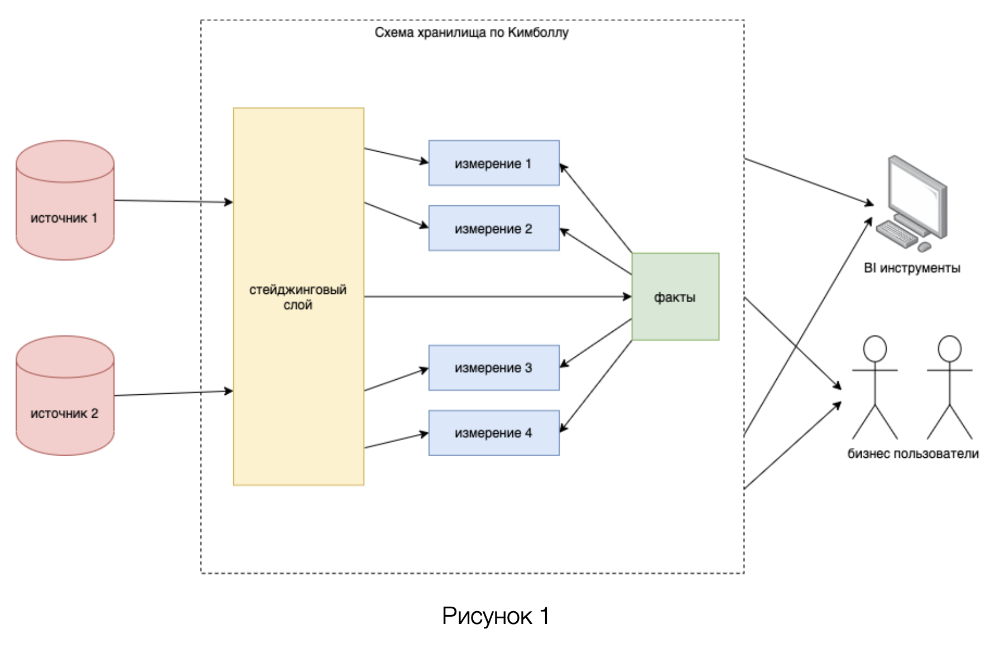

Из стейжа данные попадают в модель типа **«звезда»** (star scheme) (Рисунок 2). Эта модель представляется двумя видами таблиц: таблицами **фактов** и таблицами **измерений**.

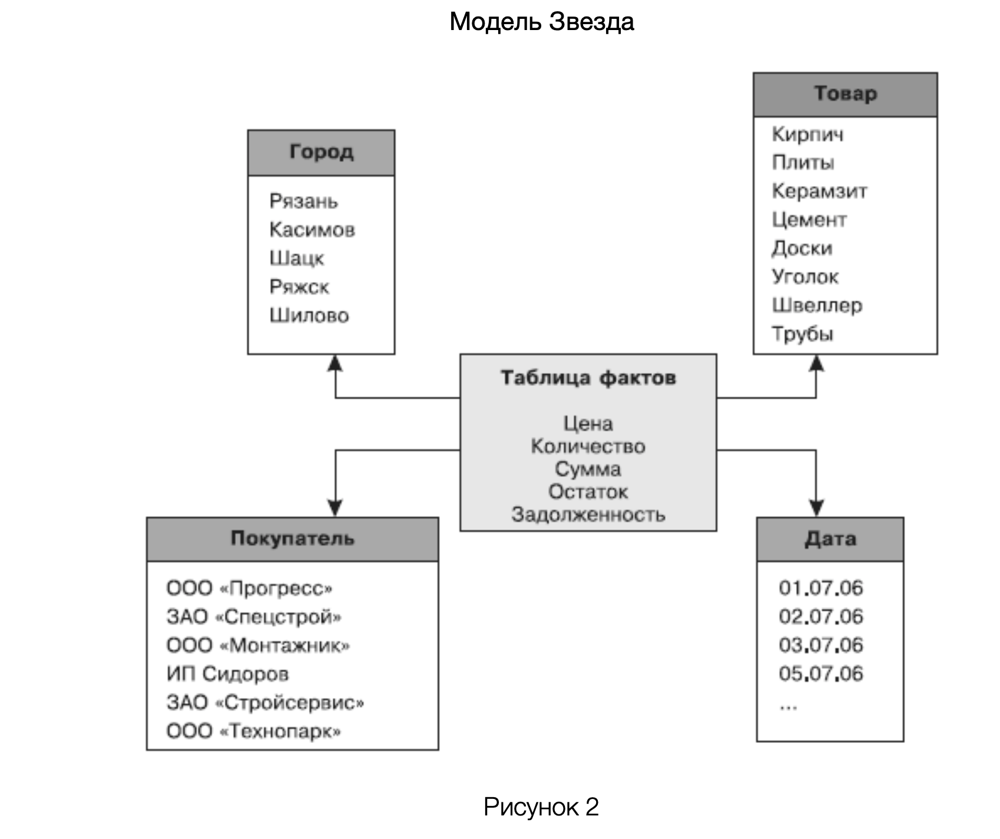

### Таблицы измерений

**Таблица измерений** (англ. dimension table) — таблица в структуре многомерной базы данных, которая содержит атрибуты событий, сохраненных в таблице фактов. Атрибуты представляют собой текстовые или иные описания, логически объединенные в одно целое.
Таблица измерения имеет первичный ключ и атрибуты, описывающие факты с точки зрения некоторого направления деятельности организации.

Характеристики измерений:

    • Таблицы измерений содержат данные о детализации фактов;
    • Таблицы измерений содержат описательную информацию о числовых значениях в таблице фактов, т.е. они содержат атрибуты фактов;
    • Как правило, таблицы измерений содержат большое количество полей;
    • Таблицы измерений содержат обычно значительно меньше строк, чем таблицы фактов;
    • Атрибуты таблиц измерений обычно используются при визуализации данных в отчетах и запросах;

Виды измерений:
    
    • Медленно меняющимися измерениями (Slowly Changing Dimensions) называются таблицы измерений, в которых некоторые атрибуты могут изменить свои значения по истечении некоторого периода времени, причем частота таких изменений является небольшой. Всего существует 8 основных типов SCD, которые определяют, как история изменений может быть отражена в модели.
    
    • Быстро меняющимися измерениями (Rapidly Changing Dimensions) называются таблицы измерений, в которых некоторые атрибуты могут часто менять свои значения в короткие периоды времени.

Медленно меняющиеся измерения делятся на следующие типы:

    • SCD0
    • SCD1
    • SCD2
    • SCD3
    • SCD4
    • SCD6

### SCD0

**Тип 0** - заключается в том, что данные после первого попадания в таблицу далее никогда не изменяются. Этот метод практически никем не используется, т.к. он не поддерживает версионности. Он нужен лишь как нулевая точка отсчета для методологии SCD. По сути, вообще не SCD.

### SCD1

**Тип 1** — это обычная перезапись старых данных новыми. В чистом виде этот метод тоже не содержит версионности и используется лишь там, где история фактически не нужна.

Достоинства:
    
    • Не добавляется избыточность
    • Очень простая структура
Недостатки:
    
    • Не хранит истории

### SCD2

**Тип 2** - для каждой версии создается отдельная запись в таблице с добавлением поля - ключевого атрибута данной версии, например: номер версии, дата изменения или дата начала и конца периода существования версии.

Пример:

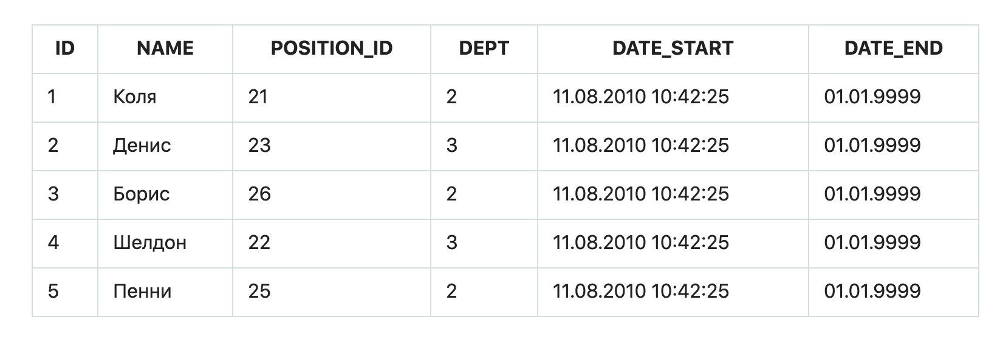

Достоинства:

    • Хранит полную и неограниченную историю версий
    • Удобный и простой доступ к данным необходимого периода

Недостатки:

    • Провоцирует на избыточность или заведение дополнительных таблиц для хранения изменяемых атрибутов измерения
    • Усложняет структуру или добавляет избыточность в случаях, если для аналитики потребуется согласование данных в таблице фактов с конкретными версиями измерения и при этом факт может быть не согласован с текущей для данного факта версией измерения.

### SCD3

**Тип 3** - в самой записи содержатся дополнительные поля для предыдущих значений атрибута. При получении новых данных, старые данные перезаписываются текущими значениями.

Пример:

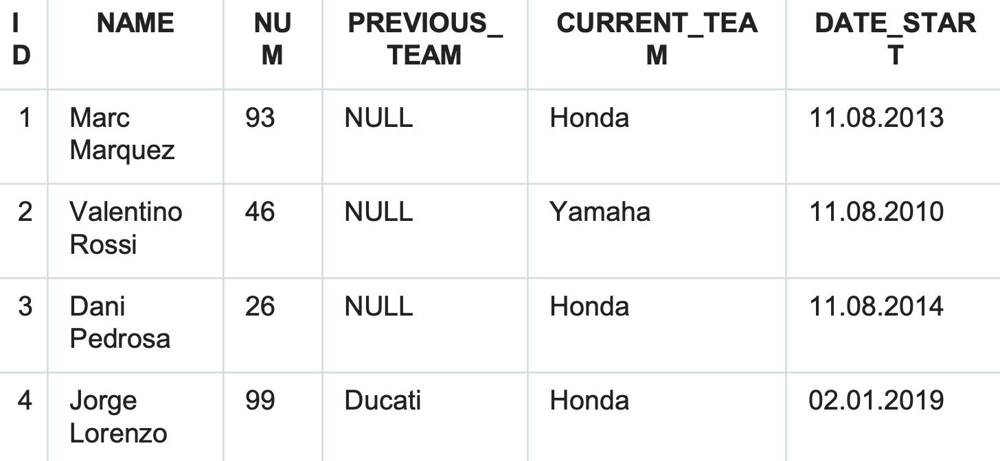

Достоинства:
    
    • Небольшой объем данных
    • Простой и быстрый доступ к истории

Недостатки:
    
    • Ограниченная история

### SCD4

**Тип 4** - история изменений содержится в отдельной таблице: основная таблица всегда перезаписывается текущими данными с перенесением старых данных в другую таблицу. Обычно этот тип используют для аудита изменений или создания архивных таблиц.

Пример:

**Основная таблица**
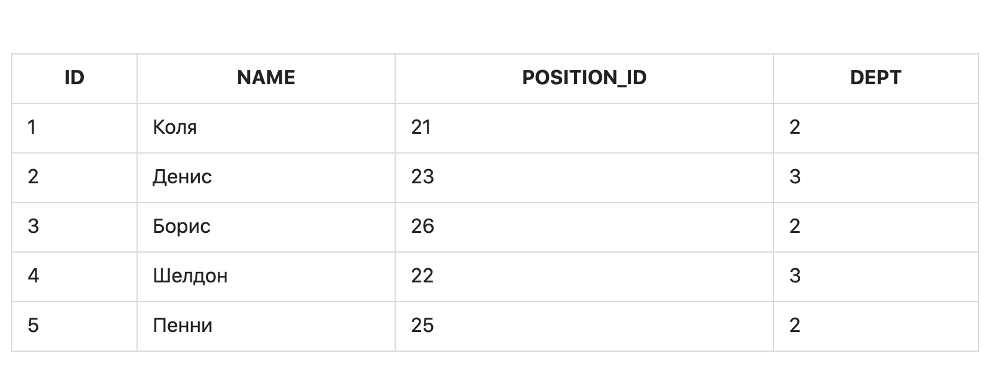

**Таблица с историей**
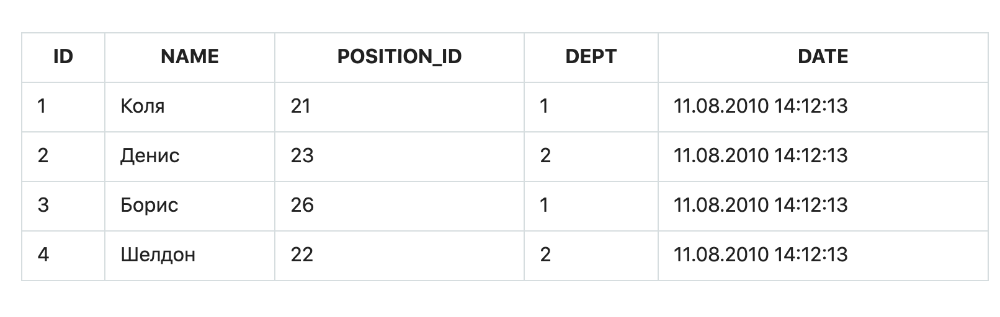

Достоинства:
    
    • Быстрая работа с текущими версиями

Недостатки:
    
    • Разделение единой сущности на разные таблицы

### SCD6

**Тип 6** был придуман Ральфом Кимболлом(Ralph Kimball) как комбинация вышеназванных методов и предназначен для ситуаций, которые они не учитывают или для большего удобства работы с данными. Он заключается во внесении дополнительной избыточности: берется за основу тип 2, добавляется суррогатный атрибут для альтернативного обзора версий(тип 3), и перезаписываются одна или все предыдущие версии(тип 1).

Пример:

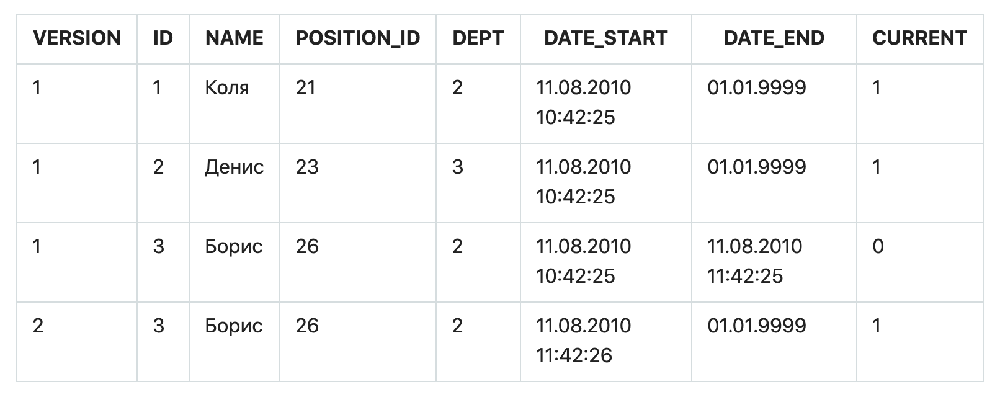

В данном примере, добавление суррогатного ключа добавляет возможность ссылаться из таблиц фактов на конкретную версию измерения, которая может не принадлежать времени существования самого факта, а индикатор текущей версии может помочь секционировать по текущим версиям.

В целом же любая комбинация основных типов SCD относится к гибридному типу, поэтому как их недостатки так и достоинства зависят от конкретной реализации.

### RCD

Значение атрибутов измерений может меняться часто за короткий период времени. Модели для управления такими измерениями зависят от кардинальности таблиц измерений. Если кардинальность таблиц измерений является небольшой (до 10000 записей), то может быть использован такой же подход, как в случае медленно меняющихся измерений. В случае очень больших таблиц измерений (до миллиона записей) следует избегать дублирования записей и не создавать новые дополнительные записи. Поскольку необходимо помнить о производительности выполнения запросов с такими измерениями, подходы к моделированию таких измерений являются важными.

Основным приемом моделирования быстро меняющихся измерений является логическое разбиение таблицы измерения на две или более таблицы. При этом для быстро меняющихся атрибутов часто используют дискретный диапазон изменений, чтобы сократить объем данных в таблице.

Пример:
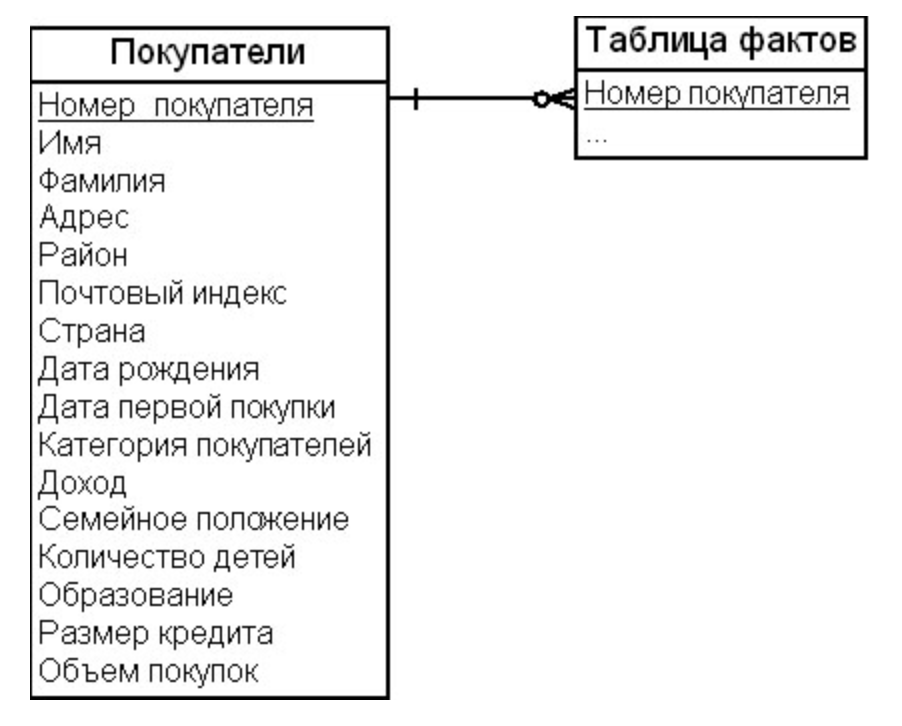

Суть приема логического разбиения состоит в следующем: создаются две сущности, одна из которых содержит атрибуты, которые меняются медленно, а другая сущность включает в себя атрибуты, которые меняются быстро. Для измерения "Покупатели", это может быть сделано, так:

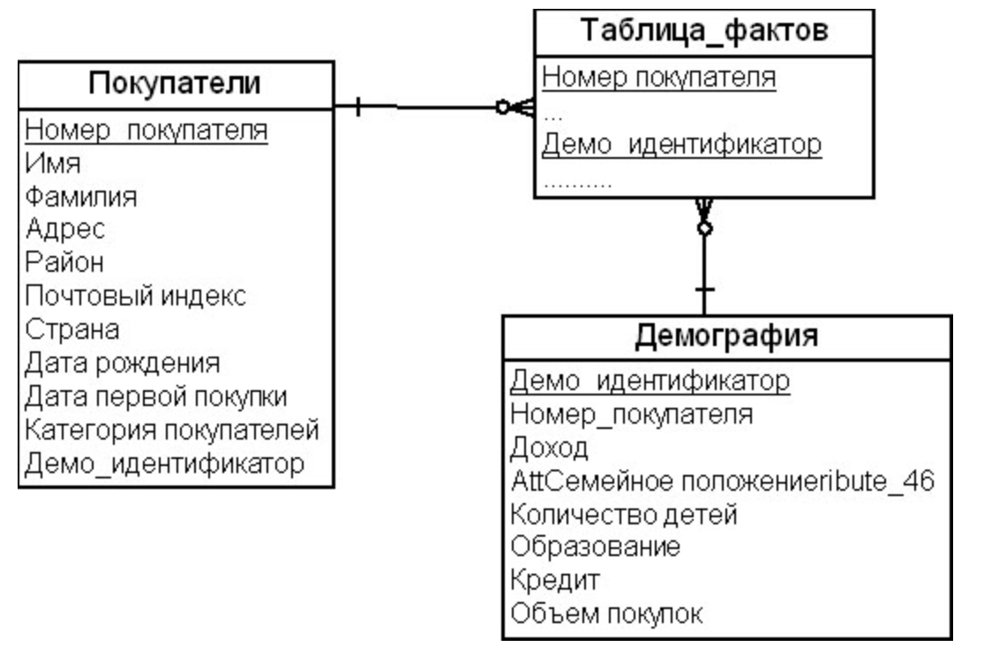

Достоинства:
    
    • частая смена профиля покупателя не приводит к сложности представления данных и не увеличивает размеров используемой памяти за счет отсутствия в схеме дублирования значений медленно меняющихся или неизменяемых атрибутов

Недостатки:

    • навигация по данным будет осуществляться медленнее, а применение диапазонов дискретных значений для демографических атрибутов непрактично

### Таблицы фактов

**Таблица фактов** (fact table) - сущность, атрибутами которой являются факты (метрики или описания) и составной ключ, связывающий таблицу фактов с таблицами измерений взаимосвязью "один ко многим".

Основными характеристиками таблицы фактов являются следующие:

    • Таблица фактов содержит числовые параметры (метрики)
    • Каждая таблица фактов имеет составной ключ, состоящий из первичных ключей таблиц измерений. Первичный ключ таблицы измерений является внешним ключом в таблице фактов.

Факты в модели данных типа звезда имеют следующие виды:

    • аддитивные факты (Additive facts)
    • полуаддитивные факты (Semiadditive facts)
    • неаддитивные факты (Non-additive facts)
    • числовые меры интенсивности (Numerical Measures of Intensity)

Пусть сущность таблицы фактов "Продажи" с атрибутами первичного ключа "Идентификатор времени", "Идентификатор товара", "Идентификатор магазина" имеет следующие факты (метрики): "Количество покупателей", "Суммарная прибыль" и "Количество продаж".

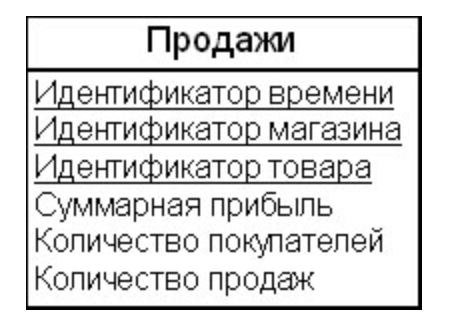

**Аддитивные факты** (Additive facts). Факт называется аддитивным, если его имеет смысл использовать с любыми измерениями для выполнения операций суммирования с целью получения какого-либо значимого результата. Например, количество продаж, суммарная прибыль:

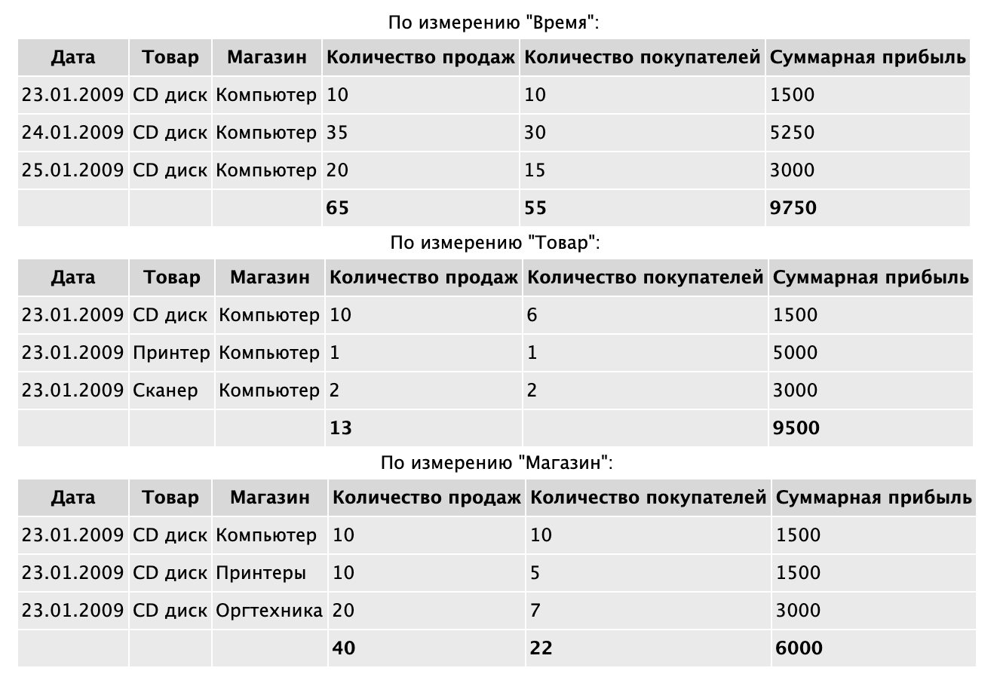

**Полуаддитивные факты** (Semiadditive facts). Факт называется полуаддитивным, если его имеет смысл использовать совместно с некоторыми измерениями для выполнения операций суммирования с целью получения какого-либо значимого результата. Например, количество покупателей:

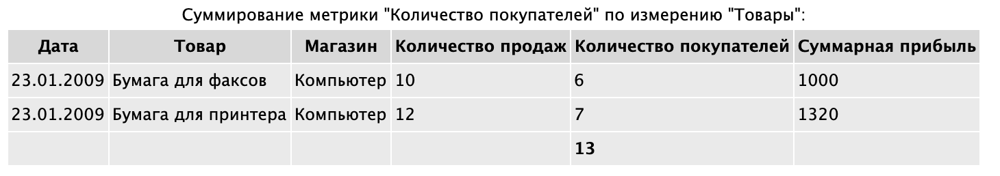

**Неаддитивные факты** (Non-additive facts). Факт называется неаддитивным, если его не имеет смысла использовать совместно с каким-либо измерением для выполнения операций суммирования с целью получения какого-либо значимого результата. Например, измерение комнатной температуры;

**Числовые меры интенсивности** (Numerical Measures of Intensity). Факт называется числовой мерой интенсивности, если он, являясь неаддитивным по времени, допускает агрегацию и суммирование по некоторому числу временных периодов. Например, остаток на счете.

Свойства данных в таблицах фактов:

    • числовые параметры используются для агрегации и суммирования;
    • значения данных должны обладать свойствами аддитивности или полуаддитивности и по отношению к измерениям, для того чтобы их можно было суммировать;
    • все данные таблицы фактов должны быть однозначно идентифицированы через ключи таблиц измерений, чтобы обеспечить доступ к ним через таблицы измерений;


Таким образом, таблицу фактов можно разделить на две части. Первая часть состоит из первичных ключей измерений, а вторая — из числовых параметров функционально зависящих от ключей таблиц измерений.

Виды таблиц фактов:

    • Транзакционная таблица фактов (Transaction facts). В такой таблице фактов сохраняют факты, которые фиксируют определенные события (транзакции). Это факты, описывающие каждое событие бизнеса. Например, продажи товара.
    
    • Таблица фактов периодических моментальных снимков (Snapshot). В такой таблице собирают факты, фиксирующие текущее состояние определенного направления бизнеса. Это факты, которые описывают текущее состояние определенного направления бизнеса для любой комбинации значений измерений за данный период времени. Например, продажи организации на определенную дату (ежедневно).
    
    • Таблица фактов кумулятивных моментальных снимков (Accumulated Snapshot). В такой таблице собирают факты, фиксирующие некоторое итоговое состояние определенного направления бизнеса на текущий момент времени. Это факты, которые описывают промежуточные итоги деятельности организации по определенному направлению бизнеса для любой комбинации значений измерений за данный период времени. Например, продажи этого года на определенную дату.

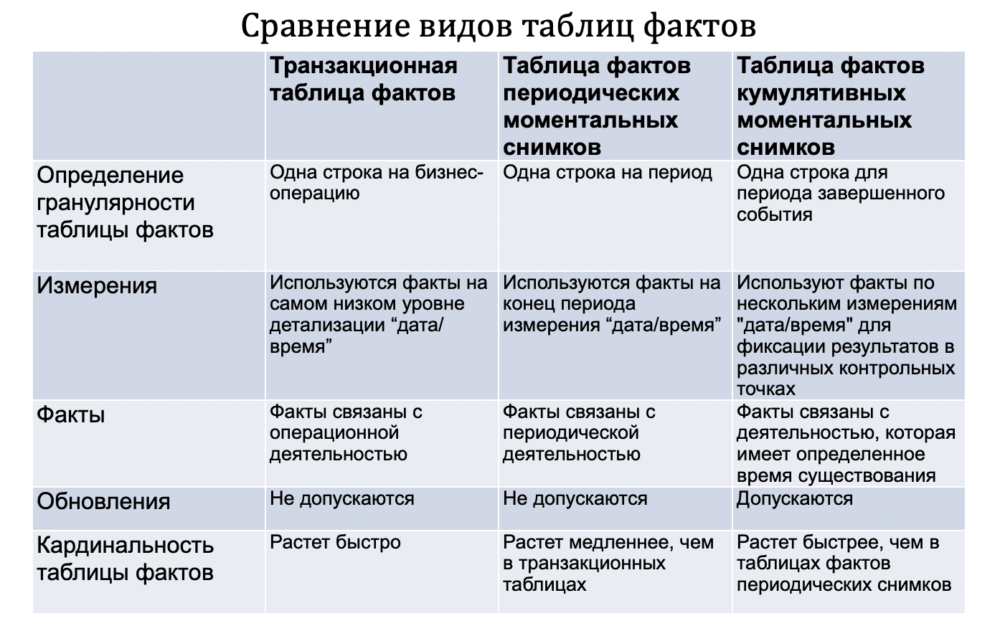

Чтобы эффективно управлять данными в модели данных типа Звезда, нужен определенный интерфейс. Таким интерфейсом является **матрица корпоративного хранилища**.

**Матрица корпоративного хранилища** (Enterprise Bus Matrix) - это таблица или документ, которая описывает связи между таблицами фактов и измерений. На Рисунке 3 показана упрощенная версия матрицы шины торговой организации в разрезе программы лояльности клиентов.

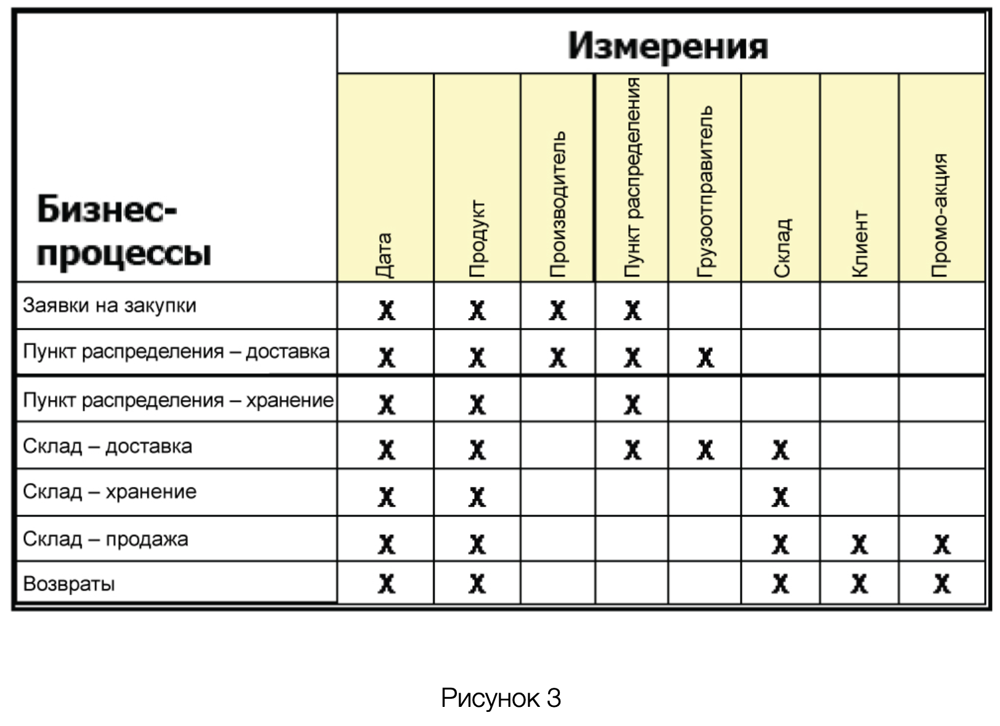

Существует разновидность схемы звезда - схема **снежинка**. Так же как и в схеме звезды, схема снежинки представлена централизованной таблицей фактов, соединенной с таблицами измерений. Отличием является то, что здесь таблицы измерений нормализованы с рядом других связанных измерительных таблиц, — в то время как в схеме звезды таблицы измерений полностью денормализованы, с каждым измерением представленным в виде единой таблицы, без соединений на связанные таблицы в схеме снежинки. Чем больше степень нормализации таблиц измерений, тем сложнее выглядит структура схемы снежинки. 

**Снежинка:**
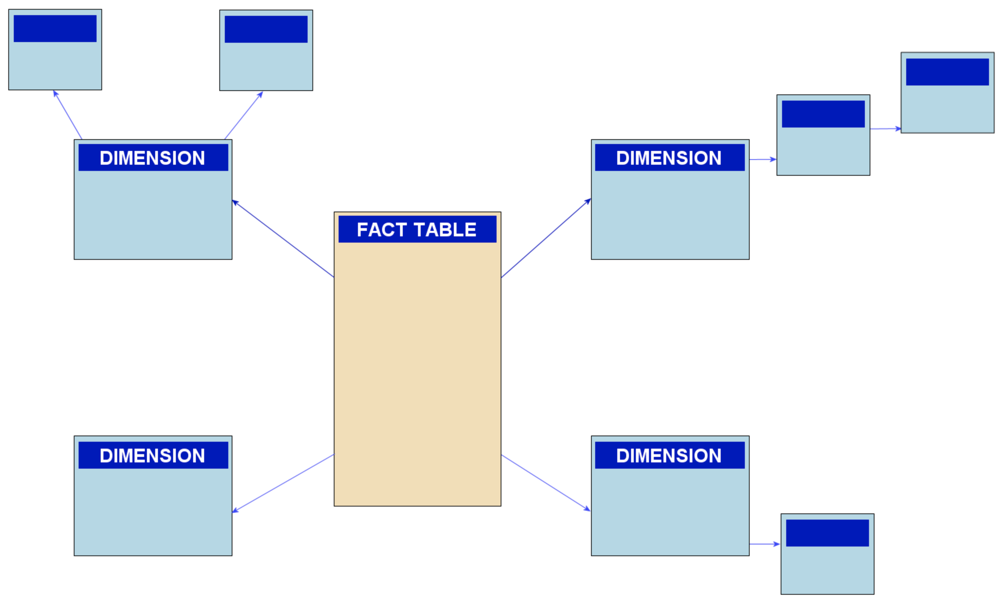

Достоинства:

    • использование меньшего дискового пространства
Недостатки:

    • обилие join-ов, низкая производительность запросов

Также стоит упомянуть схему **созвездия фактов** (галактики). Отличается от схемы звезды наличием нескольких таблиц фактов.

**Созвездие фактов**
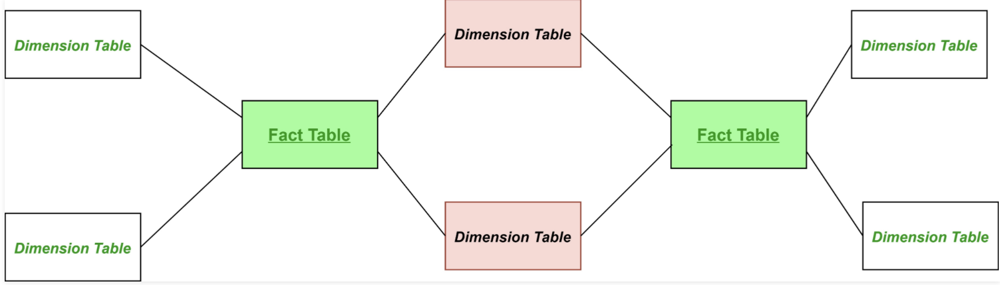

Достоинства:
    
    • более гибкое представление, по сравнинию со звездой
Недостатки:

    • более сложная структура, сложнее реализовать и поддерживать

# Хранилище по Инмону

**Билл Инмон** - отец системного подхода в области анализа и проектирования DWH. Автор классического определения хранилищ данных. Название его подхода к проектированию - **Corporate Information Factory (CIF)**.

Процесс построения CIF в формальном виде выглядит следующим образом:

    1. Тщательный анализ бизнеса в целом
    2. Выявляются бизнес-области
    3. В них - ключевые бизнес-сущности
    4. Затем - их характеристики (атрибуты) и связи между ними.
Проектирование **логической модели** происходит “сверху вниз”.

В результате анализа появляется понимание, какие сущности участвуют в бизнес-процессах и как они взаимодействуют друг с другом. Следующий шаг – это разработка **физической модели** на основе логической. Можно не завершать логическую модель полностью, а переносить ее в базу по частям - отдельными сущностями. Модель должна быть в нормализованном виде. Полученная в результате разработки нормализованная структура по Инмону называется «хранилищем данных» или детальным слоем. Схема хранилища по Инмону представлена на рисунке 4.

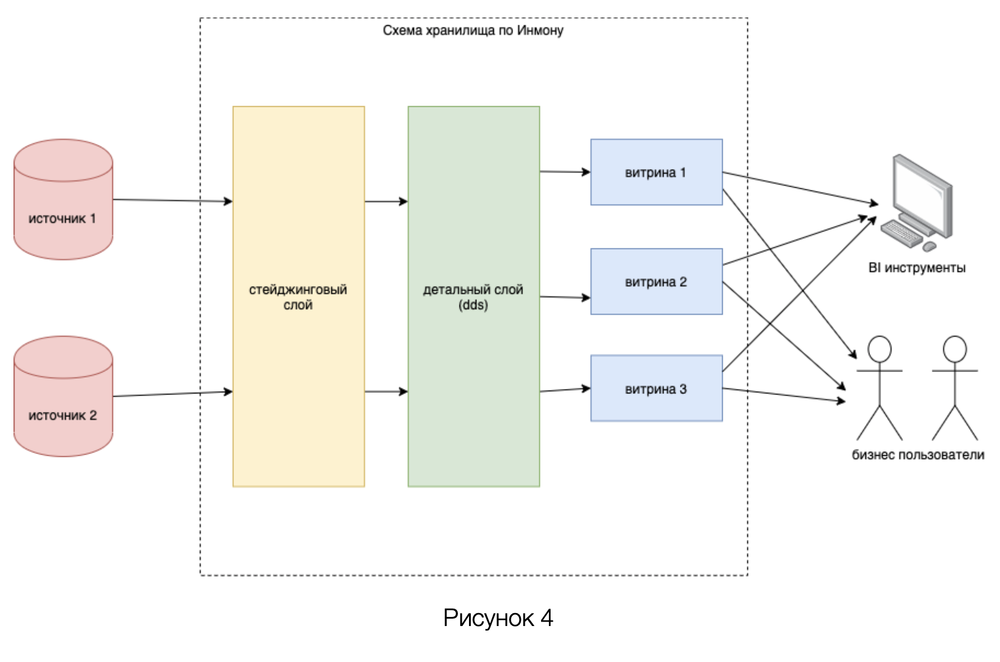

Отличительные особенности хранилища по Инмону (DWH-I):
    
    • Использование реляционной модели организации атомарных данных, пространственной - для организации витрин.
    
    • Строительство хранилища не сразу, а по частям.
    
    • Использование третьей (или даже более высокой) нормальной формы для организации детальных данных (предоставляет широкие возможности для манипулирования ими, изменения формата и способа представления).
    
    • DWH-I - это проект корпоративного масштаба, охватывающий все отделы и обслуживающий нужды всех пользователей корпорации.
    
    • DWH-I - это не механическая коллекция витрин данных, а физически целостный объект.

По сравнению с подходом Камбалла, построение CIF занимает куда больше времени и требует большее квалифицированных кадров. Плюсы от CIF будут видны на долгой дистанции. В их число входят: отсутсвие избыточности, гибкость, детализированность.

Если мы обобщим все выше изложенное, то хранилище по Кимбаллу (DWH-K) это быстрый проект под конкретные отчеты. В то время как DWH-I долгосрочный проект, назначение которого аккумулировать все имеющиеся в распоряжении данные, с целью последующего использования в самых разных областях, от простых отчетов до обучения нейросетей.

# Концепция Data Vault

Data Vault – набор уникально связанных нормализованных таблиц, содержащих детальные данные, отслеживающих историю изменений и предназначенных для поддержки одной или нескольких функциональных областей бизнеса. Автор: Дэн Линстедт (Dan E. Linstedt)

Дизайн Data Vault – гибок, масштабируем, последователен и приспосабливаем к потребностям предприятия. Это – модель данных, спроектированная специально для удовлетворения потребностей хранилищ данных предприятия.

В модели Data Vault содержаться структуры, которые знакомые и соответствуют традиционным определениям схемы звезда и 3NF, включая: измерения, связи многие ко многим и стандартные табличные структуры. Различия заключаются в представлении отношений, структурировании полей и хранении детальных данных, основанных на времени. Дизайн Data Vault сосредоточен вокруг функциональных областей бизнеса.

Для того чтобы сохранить дизайн простым и изящным, используется минимальное количество типов сущностей:

    • Хаб (Hub) хранит сущности.
    • Связь (Link) обеспечивает транзакционную интеграцию между Хабами (связи между сущностями).
    • Сателлит (Satellite) предоставляет контекст первичного ключа Хаба (атрибуты, описания).

Каждая сущность предназначена для обеспечения максимальной гибкости и масштабируемости, сохраняя при этом большинство традиционных навыков моделирования данных.  

**Хабы (Hub)** являются отдельными таблицами, содержащими как минимум уникальный список бизнес ключей.

Атрибуты Хаба включают:

    • Ключ бизнес-сущности из внешней системы
    • Суррогатный ключ (Surrogate Key)
    • Временная отметка даты загрузки (Load Date Time Stamp), регистрирующая, когда ключ впервые был загружен в хранилище.
    • Источник данных (Record Source) – регистрация исходной системы, используется для обратной трассировки (отслеживания) данных.

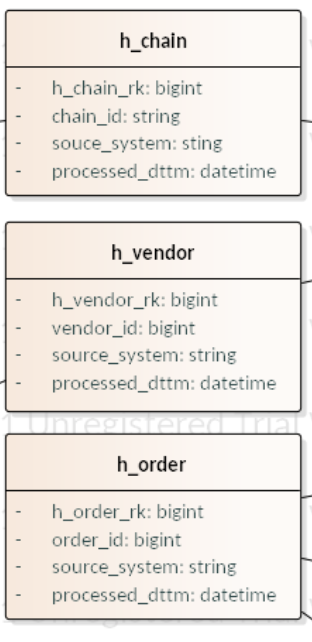

**Связи (Link)** – физическое представление связей "многие ко многим" третьей нормальной формы (3NF). Связь представляет отношения или транзакцию между двумя или более компонентами бизнеса (два или более бизнес ключа).

Связь содержит следующие атрибуты:

    • Суррогатный ключ (Surrogate Key)

    • Ключи Хабов: от 1-го Хаба до N-го Хаба – ключи Хабов мигрируют в сущность Связь, образуя составной ключ, и представляют взаимодействия и связи между Хабами.
    
    • Временная отметка даты загрузки (Load Date Time Stamp), регистрирующая, когда связь/транзакция впервые была создана в хранилище.
    
    • Источник данных (Record Source) – регистрация исходной системы, используется для обратной трассировки (отслеживания) данных. 

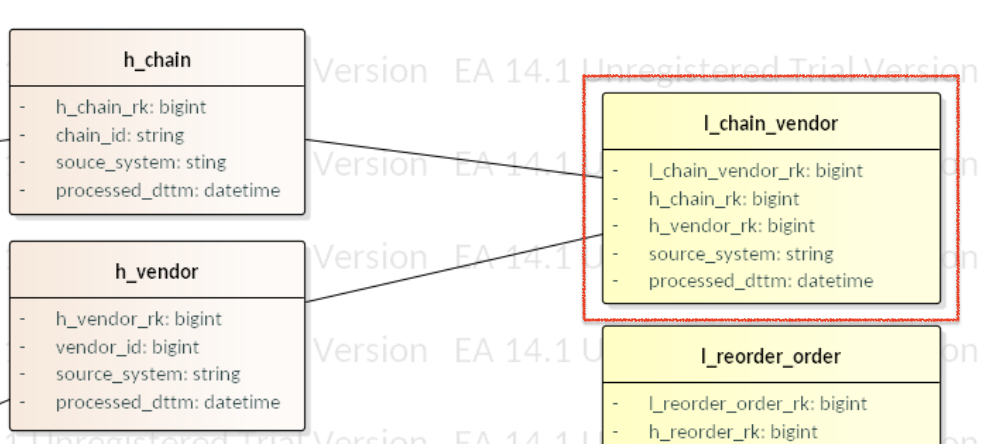

**Сателлиты (Satellite)**, являются контекстной (описательной) информацией ключа Хаба. Описание подвергается изменениям с течением времени, и поэтому структура Сателлитов должна быть способна хранить новые или измененные детальные данные. 

Сателлит состоит из следующих обязательных атрибутов:

    • Первичный ключ Сателлита: Первичный ключ Хаба или первичный ключ Связи – мигрирует в Сателлит из Хаба или Связи.
    
    • Первичный ключ Сателлита: Временная отметка даты загрузки (Load Date Time Stamp) – регистрация, когда информация контекстная стала доступна в хранилище (всегда вставляется новая строка).
    
    • Источник данных (Record Source) – регистрация исходной системы, используется для обратной трассировки (отслеживания) данных

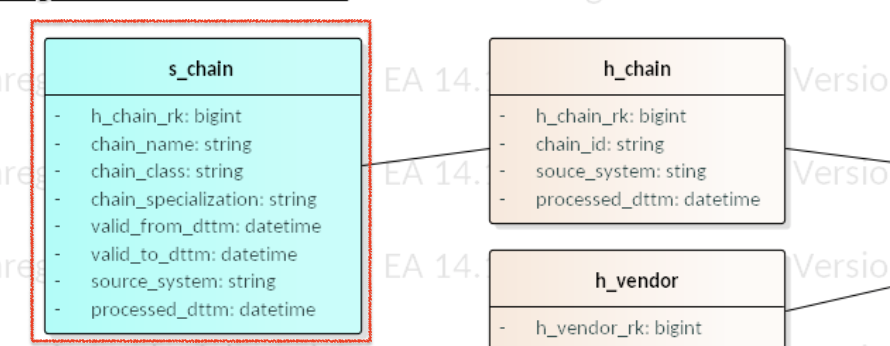

Процесс построения модели Data Vault выглядит следующим образом:

    1. Моделирование Хабов. Для этого требуется понимать основные бизнес сущности (бизнес ключи) и как они используются в выбранной области.

    2. Моделирование Связи. Выявление возможных отношений между ключами – требует формулировки, как бизнес работает сегодня в контексте каждого бизнес ключа.

    3. Моделирование Сателлитов. Обеспечение контекста, как каждой бизнес сущности (бизнес ключу), так и транзакциям/сделкам (Связи), соединяющим Хабы вместе. С этого начинается проявляться полная картина о бизнесе.

Основные правила, которым нужно следовать при построении Data Vault:
    
    1. Ключи Хабов не могут мигрировать в другие Хабы (никаких Хабов подобных родитель/потомок не должно быть). Моделирование в такой манере нарушает гибкость и расширяемость техники моделирования Data Vault.

    2. Хабы должны быть связаны с помощью сущностей типа Связь.

    3. С помощью Связей может быть связано более двух Хабов.

    4. Сущности Связи могут быть связаны с другими сущностями типа Связи.

    5. Связи должны иметь, по крайней мере, два связанных с ними Хаба.

    6. Суррогатные ключи могут быть использованы в Хабах и Связях.

    7. Суррогатные ключи не могут быть использованы в Сателлитах.

    8. Ключи Хаба всегда мигрируют наружу.

    9. Бизнес-ключи Хаба никогда не меняются, первичные ключи Хабов никогда не меняются. 
    
    10. Сателлиты могут быть связаны как с Хабами, так и со Связями.
    
    11. Сателлиты всегда содержать временную отметку даты загрузки (Load Date Time Stamp).

    12. Могут быть использованы автономные таблицы, такие как календари, время, коды и описания.

    13. Связи (Links) могут иметь суррогатный ключ.

    14. Сателлиты фиксируют только изменения, дублирования строк не должно быть.

    15. Данные распределяются по структуре Сателлитов, основываясь на: 1) типе информации, 2) темпах изменения.

Пример модели такси-сервиса по методологии Data Vault:

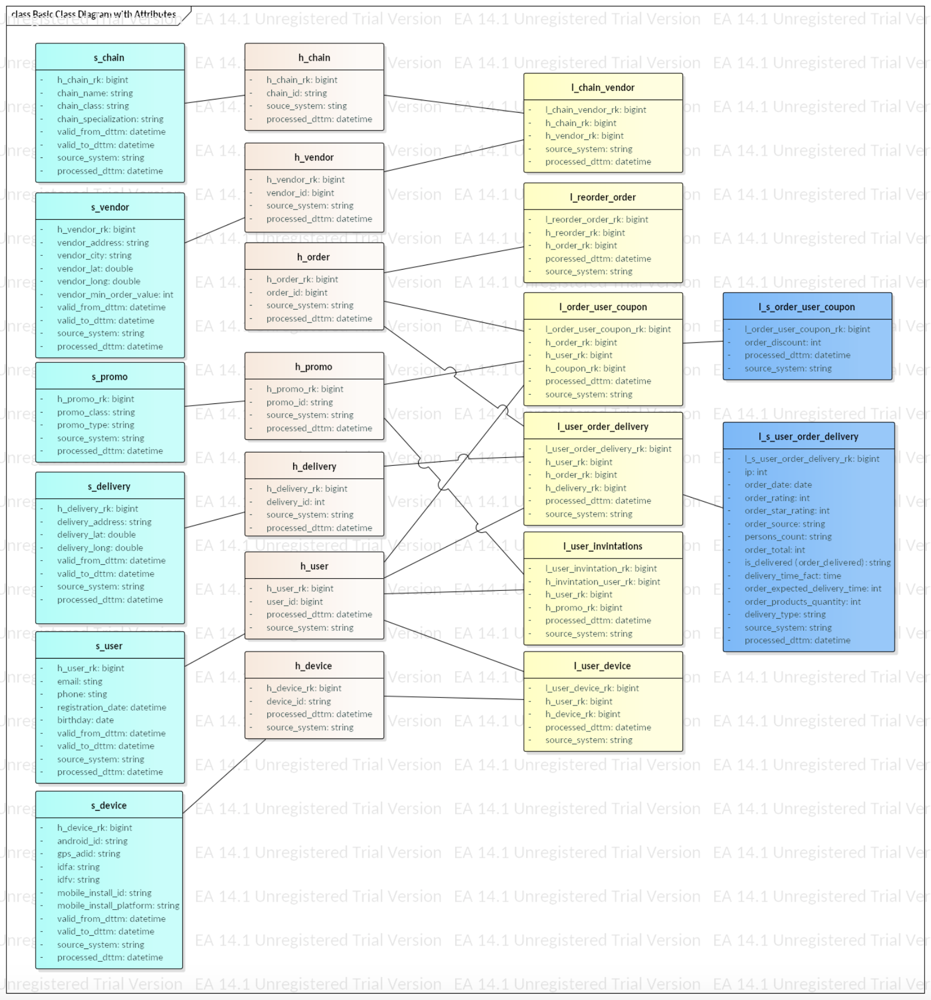

# Концепция Anchor modeling

Якорное моделирование - это технология моделирования гибкой базы данных, подходящая для информации, которая со временем изменяется как по структуре, так и по содержанию.

В методике моделирования используются четыре модели моделирования: якорь, атрибут, связь и узел, каждый из которых отражает различные аспекты моделируемого домена. Полученные модели могут быть переведены в физические проекты баз данных с использованием формализованных правил. Когда такой перевод сделан, таблицы в реляционной базе данных будут в основном в шестой нормальной форме. Автор: Ларс Рёнбэк (Lars Rönnbäck).

В парадигме **Anchor Modeling** неизменным считается только суррогатный ключ сущности. Всё остальное (включая натуральные ключи) — просто частный случай его атрибутов. При этом все атрибуты по умолчанию независимы друг от друга, поэтому для каждого атрибута должна быть создана отдельная таблица.

Основными сущностями якорного моделирования являются: 

    • Якорь (Anchor)
    • Атрибут (Attribute)
    • Связь (Tie)
    • Узел (Knot)

**Якорь (Anchor)** — это существительное, объект реального мира. Anchor таблица должна хранить только суррогатный ключ и несколько технических полей (система-источник, дата-время загрузки).

Концептуально Anchor нужен только для одной задачи — грузить каждый уникальный товар/ пользователя/платеж только один раз. Это помогает избежать повторной загрузки, и помнить, в какой момент и из какой системы пришла исходная запись.

**Атрибут (Attribute)** — это таблица для хранения свойства, атрибута объекта. Одно свойство у объекта — одна Attribute-таблица. Десять свойств у объекта (имя, фамилия, дата рождения, пол, адрес регистрации, ...) — десять Attribute-таблиц. Каждая Attribute-таблица содержит суррогатный ключ объекта, которым является ссылка на соответствующий Anchor, поле для значения атрибута, и, опционально, дату для историчности и технические поля.

**Связь (Tie)** — это таблица для хранения связей между объектами. Соответственно, таблица должна содержать суррогатный ключ левого объекта, правого объекта и по необходимости, даты историчности и технических полей.

Важный нюанс с точки зрения моделирований — Anchor Modeling сильно отличается от Data Vault тем, что в Data Vault можно вешать данные (сателлиты) на связь (link), а в Anchor Modeling данные (Attribute) можно повесить только на Anchor, на Tie нельзя.

**Узел (Knot)** - таблица-состояние, справочник. Узлы можно рассматривать как сочетание якоря и одного атрибута. Таблицы узлов содержат суррогатный ключ, значение, мета-поля. По сути узел является справочником, который нужен для более эффективного хранения описательно информации (пример: пол м - 1, ж - 0).

Процесс проектирования Anchor modeling выглядит следующим образом:
    
    1. Моделирование якорей. Поиск основных бизнес-сущностей в предметной области.
    2. Моделирование атрибутов, узлов. Описание найденных бизнес-сущностей.
    3. Историзация атрибутов.
    4. Моделирование связей. Определение взаимоотношения сущностей.
    5. Историзация связей.

На рисунке 6, представлена часть анкорной модели, используемой в нашем хранилище. Где *cbPromo*, *cbTariff* являются якорями. Они соединены между собой связью. У каждого якоря есть набор атрибутом, которые физически являются таблицами в 6НФ. Также хочу обратить внимание на атрибут *eventTime*, этот атрибут является версионным. Он хранит все даты событий, которые приходят в стейджинговый слой. Все остальные атрибуты хранят только изменения в данных.

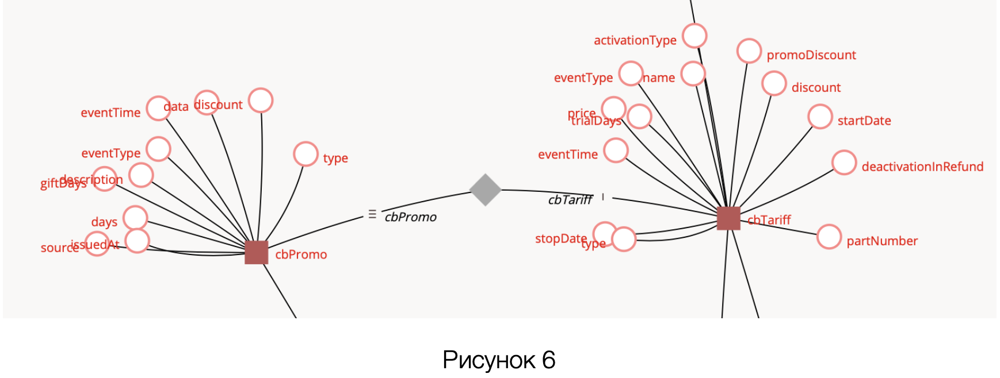

На примере объясню как это работает. Допустим нам пришли следующие данные:

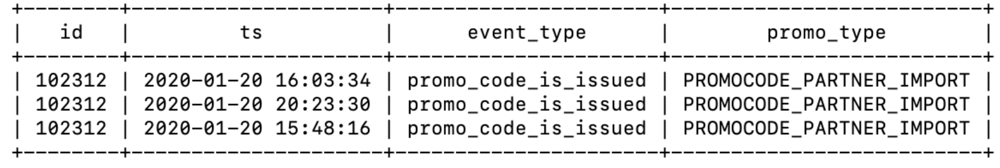

Каждая строка из *ts* попадет в версионный сателлит *eventTime*. При этом нам не обязательно хранить все строки из *event_type* и *promo_type*, так как они одинаковы в пределах данной партиции. После определенных преобразований, получим следующие данные для вставки из исходной таблицы:

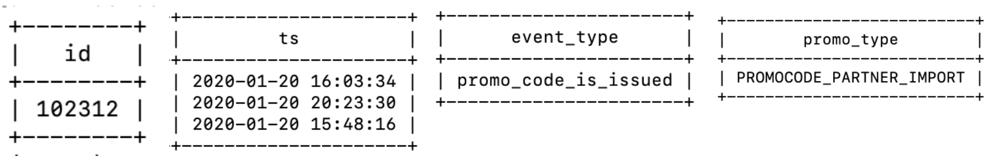

Такой подход сильно экономит место на диске.

Пример анкорной модели юнитов мейл.ру:
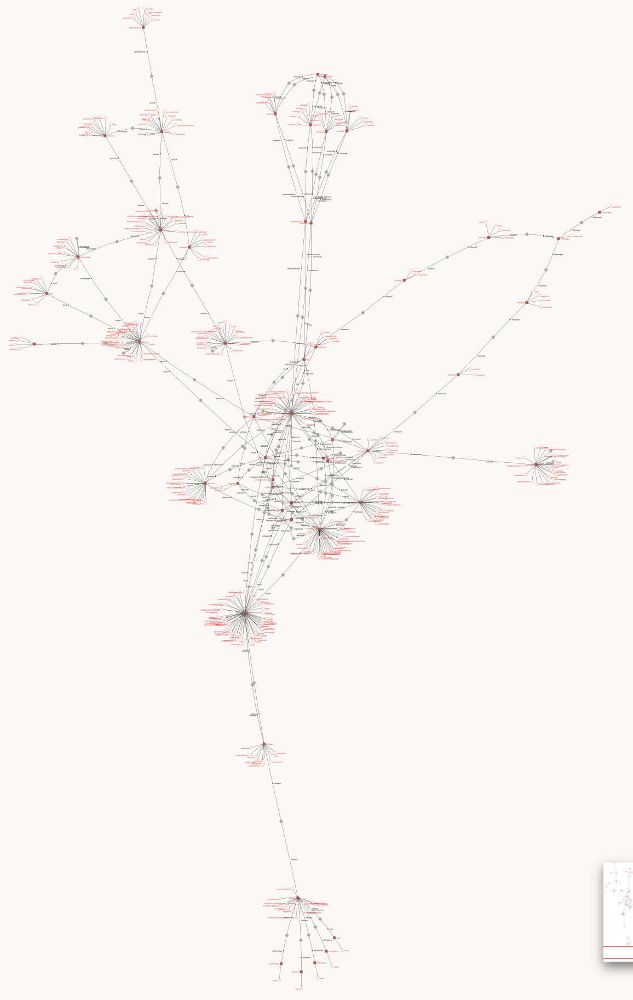

# Резюме

Основными отличиями Anchor Modeling от Data Vault являются:
    
    1. Поддержание историчности. Data Vault предусматривает реализацию медленно меняющихся измерений типа 2 с двумя датами — датой начала действия данных и датой конца действия данных. Другими словами, когда приходит новая версия данных, старая версия должна быть обновлена для выставления даты конца действия данных. Anchor Modeling предусматривает хранение только одной даты — даты начала действия данных. Такой подход позволяет реализовывать концепцию only-insert-ETL — загрузка данных без обновлений, только со вставками.

    2. В Data Vault хабы содержат как идентификатор из системы-источника, так и суррогатный ключ. Якоря содержат только суррогатные ключи

    3. В Data Vault можно вешать сателлиты на связи, а в якорном моделировании - нет

    4. Data Vault предполагает хранение атрибутов сущностей сгруппированными в таблицах-сателлитах. Например, если сущность обладает 50 атрибутами со сравнимой вероятностью изменений, методология Data Vault рекомендует хранить их в одной таблице. Методология Anchor Modeling в подобном случае требует создать 50 таблиц, по одной для каждого атрибута. Подход Anchor Modeling на первый взгляд кажется избыточным, хотя и удовлетворяет 6 нормальной форме. Сбор актуальных значений всех 50 атрибутов возможен только посредством создания специальных материализованных представлений. Без них собрать атрибуты слишком сложно для аналитика, работающего с хранилищем.

При этом не обязательно четко следовать принципам данных методологий, можно использовать их комбинацию. Например, в нашем хранилище мы используем принципы якорной модели, но при этом нарушаем пункт 2, в якоре храним суррогатный ключ и ключ бизнес сущности из системы источника. Сделано это для того, чтобы удобнее ориентироваться в данных. Зная все вышеперечисленные методологии, можно эффективно комбинировать различные методики для построение долговечного хранилища.